In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")

%matplotlib inline

In [2]:
df = pd.read_csv(r"weatherAUS.csv")
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [4]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [5]:
df.describe(include="O")

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,145460,145460,135134,134894,141232,142199,142193
unique,3436,49,16,16,16,2,2
top,2017-06-24,Canberra,W,N,SE,No,No
freq,49,3436,9915,11758,10838,110319,110316


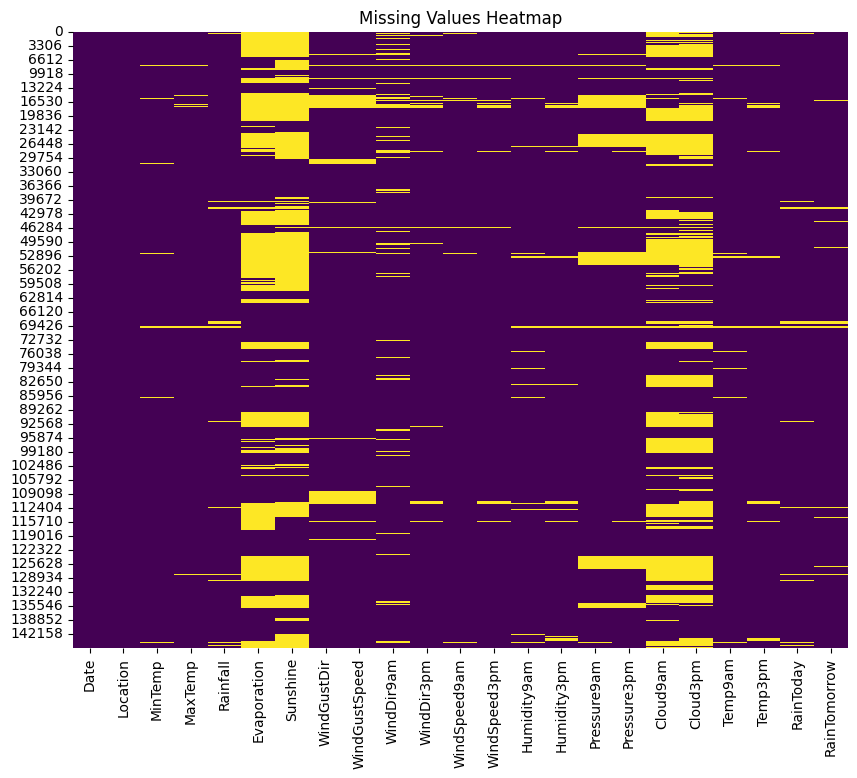

In [6]:
plt.figure(figsize=(10, 8))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

In [7]:
total_nan = df.isnull().sum()
percent_nan = round(df.isnull().sum() / len(df) * 100, 2)
nan_col = pd.concat([total_nan, percent_nan], axis=1, keys=["Total", "Percent"]).sort_values(by=["Total"], ascending=False)
nan_col.T

,Sunshine,Evaporation,Cloud3pm,Cloud9am,Pressure9am,Pressure3pm,WindDir9am,WindGustDir,WindGustSpeed,Humidity3pm,...,Rainfall,RainToday,WindSpeed3pm,Humidity9am,WindSpeed9am,Temp9am,MinTemp,MaxTemp,Date,Location
Total,69835.00,62790.00,59358.00,55888.00,15065.00,15028.00,10566.00,10326.0,10263.00,4507.0,...,3261.00,3261.00,3062.00,2654.00,1767.00,1767.00,1485.00,1261.00,0.0,0.0
Percent,48.01,43.17,40.81,38.42,10.36,10.33,7.26,7.1,7.06,3.1,...,2.24,2.24,2.11,1.82,1.21,1.21,1.02,0.87,0.0,0.0


**Insights**
- `Date` features is object type. Need to convert into datetime data type.
- All of features have missing values except `Date` and `Location`. Especially, `Evaporation`, `Sunshine`, `Cloud9am`, and `Cloud3pm` have more than 30% missing values so need to be dropped.
- Other features which have missing values need to be filled.

### **Exploratory Data Analysis**

In [8]:
# Change Date datatype to numerical features (Datetime)
df['Date'] = pd.to_datetime(df['Date'])

In [9]:
# Defines numerical and categorical columns
numerical_feature = df.select_dtypes(include=np.number).columns
categorical_feature = df.select_dtypes(include="O").columns

# Print Columns
print(f"We have {len(numerical_feature)} numerical features: {numerical_feature.to_list()}.")
print(f"\nWe have {len(categorical_feature)} categorical features: {categorical_feature.to_list()}")

We have 16 numerical features: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'].

We have 6 categorical features: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [10]:
# Proportion of count data on categorical columns
for col in categorical_feature:
    print(df[col].value_counts(normalize=True) * 100)
    print("-" * 30)

Location
Canberra            2.362161
Sydney              2.298914
Adelaide            2.195105
Darwin              2.195105
Hobart              2.195105
Perth               2.195105
Melbourne           2.195105
Brisbane            2.195105
Albury              2.089922
MountGinini         2.089922
GoldCoast           2.089922
Wollongong          2.089922
MountGambier        2.089922
Launceston          2.089922
AliceSprings        2.089922
Albany              2.089922
Townsville          2.089922
Bendigo             2.089922
Cairns              2.089922
Ballarat            2.089922
Penrith             2.089234
Newcastle           2.089234
Tuggeranong         2.089234
PerthAirport        2.068610
Williamtown         2.068610
Cobar               2.068610
BadgerysCreek       2.068610
SydneyAirport       2.068610
Richmond            2.068610
Moree               2.068610
CoffsHarbour        2.068610
NorfolkIsland       2.068610
WaggaWagga          2.068610
Witchcliffe         2.068610
Watso

**Insights**
- Some categorical features have a balance (well distributed) data.
- Target features `RainTomorrow` and `RainToday` are imbalanced.

#### **Univariate Analysis**

Numerical Features

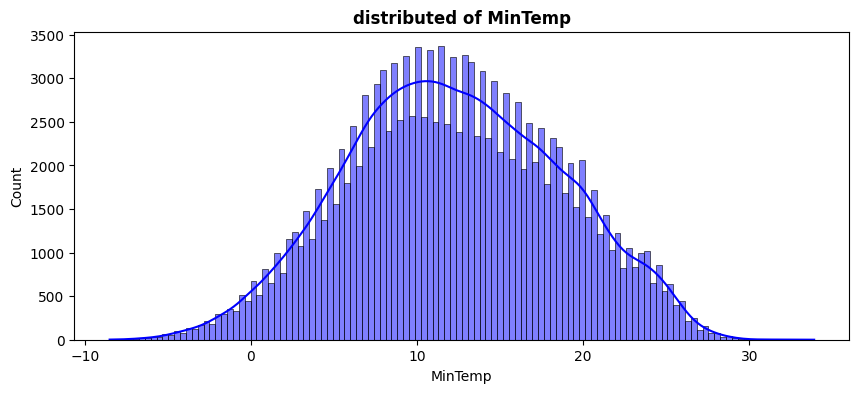

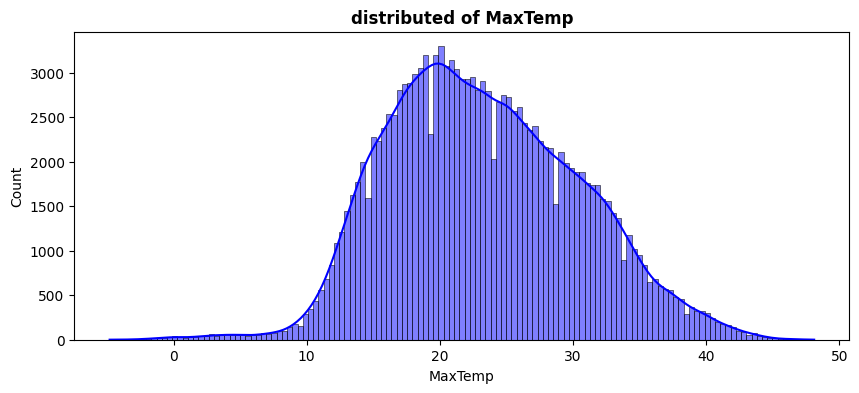

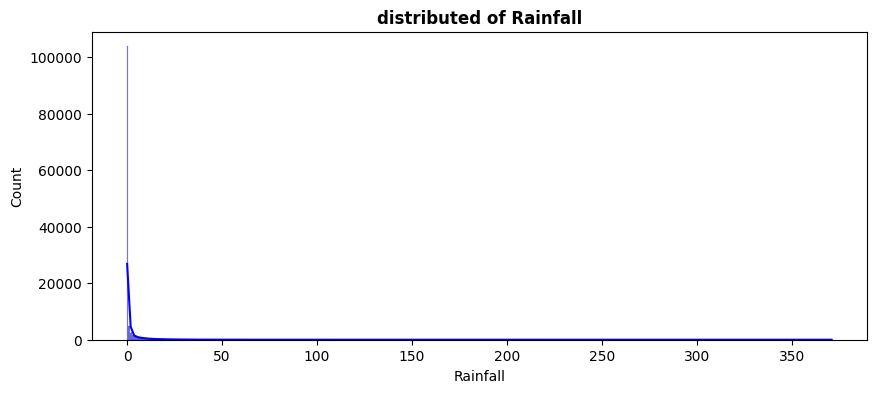

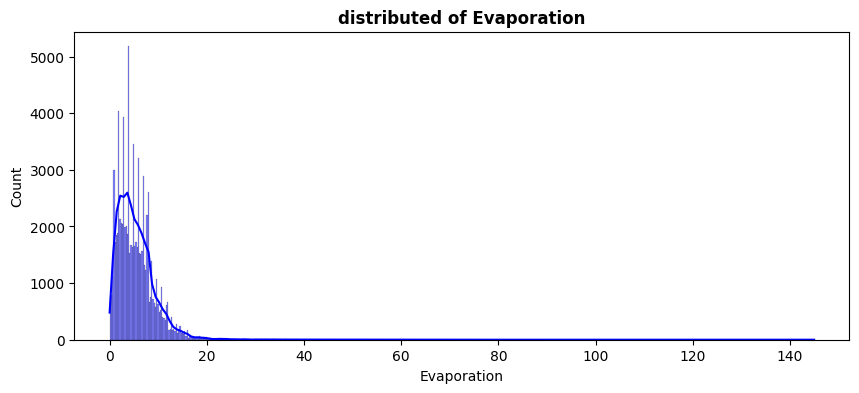

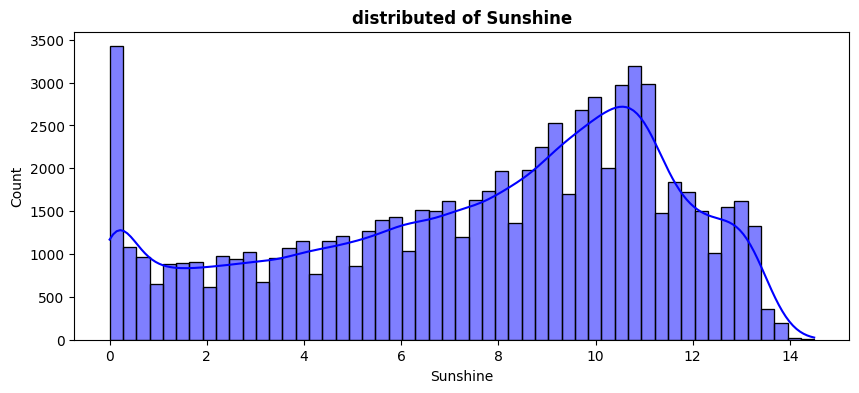

...

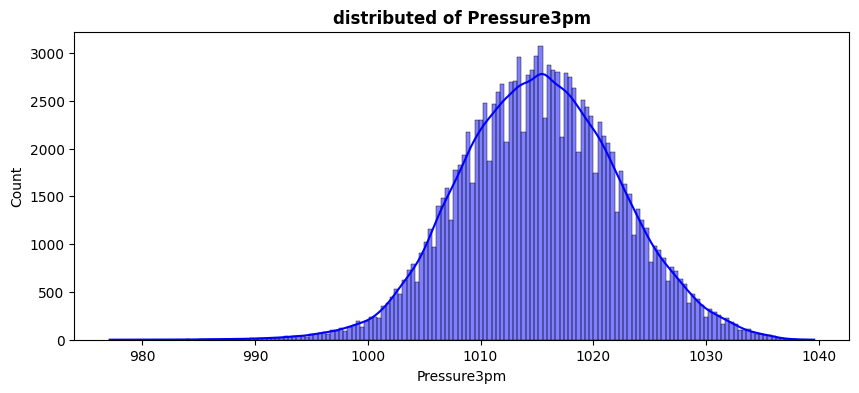

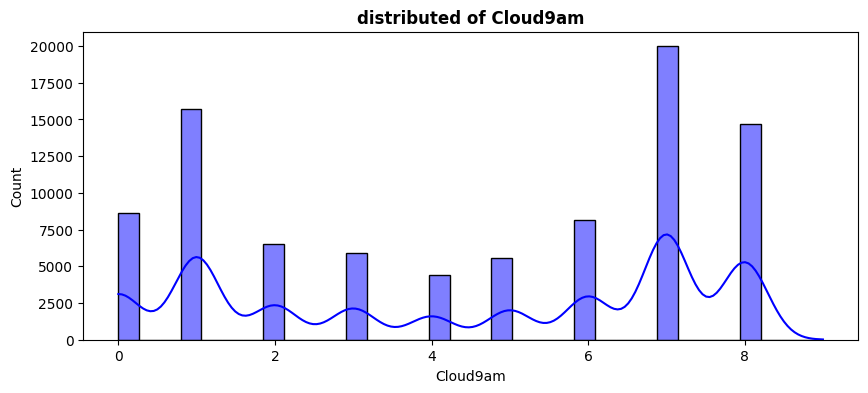

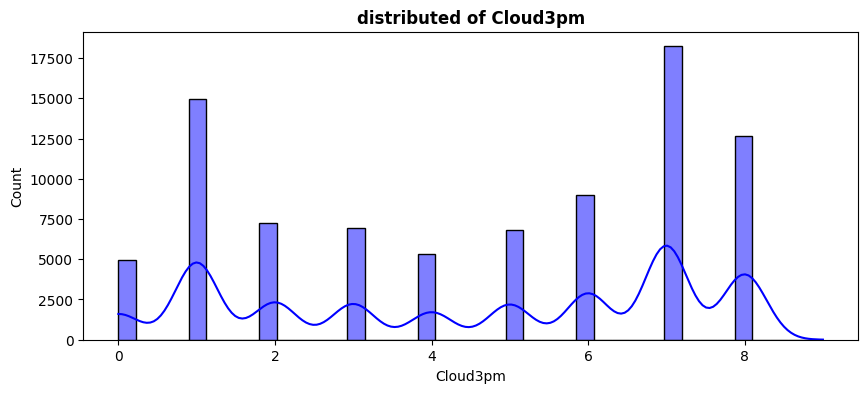

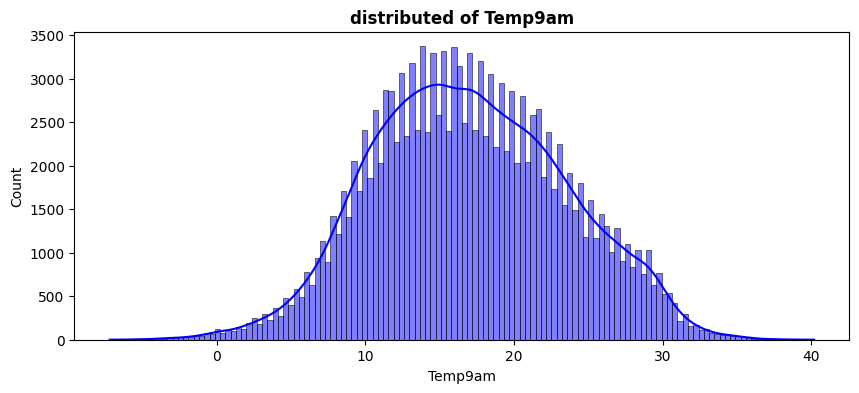

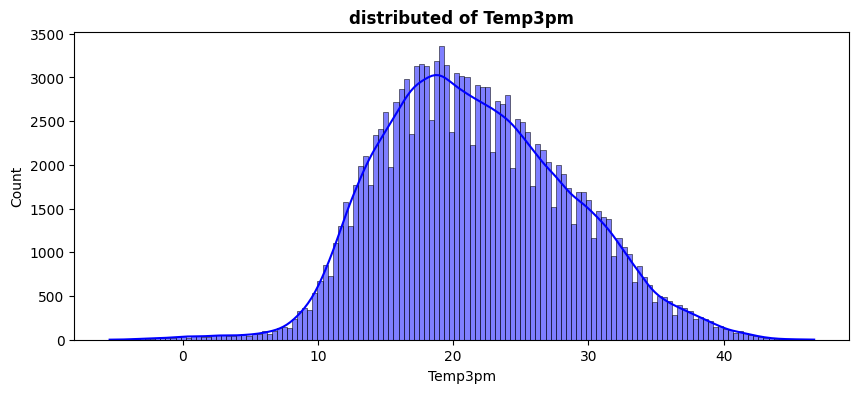

In [11]:
for i in numerical_feature:
    plt.figure(figsize=(10, 4))
    sns.histplot(x=df[i], color="blue", kde=True)
    plt.title(f"distributed of {i}", fontweight="bold")
    plt.xlabel(i)
    plt.show()

**Insights**
- `MaxTemp`, `MinTemp`, `Humidity`, `Temp9am`, `Temp3pm`, `Pressure9am`, and `Pressure3pm` are normal distributed data.
- `RainFall`, `Evaporation`, `WindGustSpeed`, `WindSpeed9am`, and `WindSpeed3pm` are left skewed data distribution.
- `Cloud9am` and `Cloud3pm` are discrete data.

Categorical Features

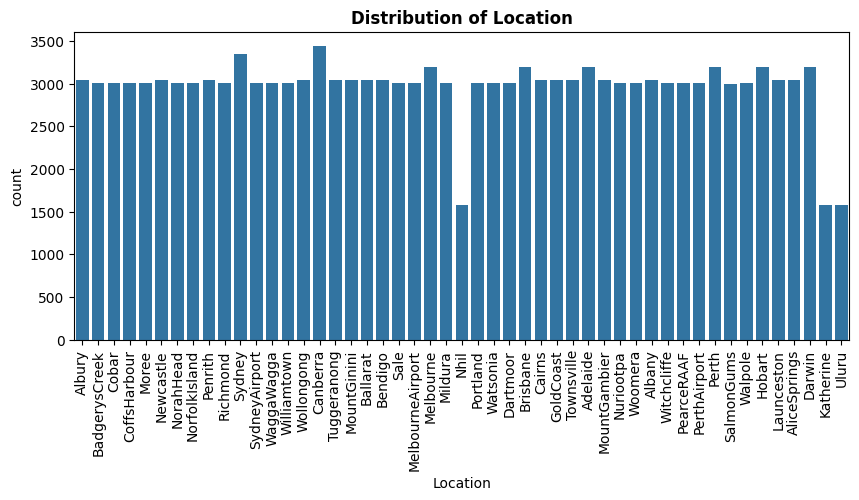

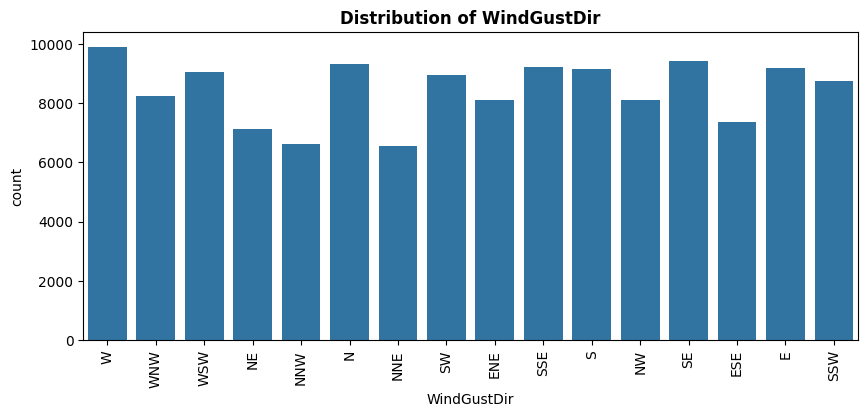

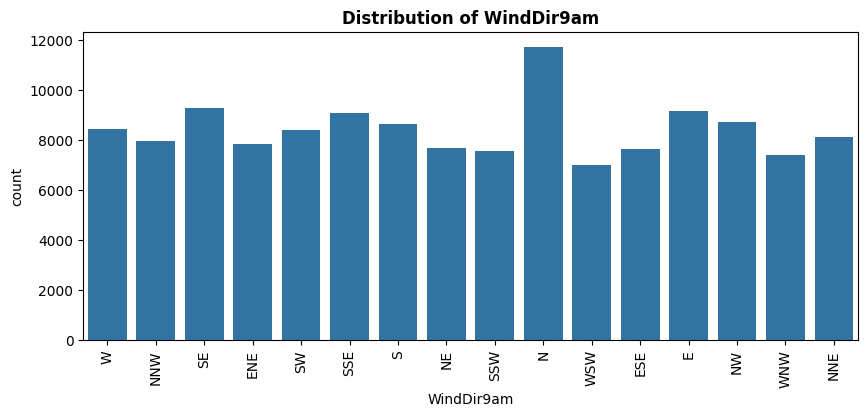

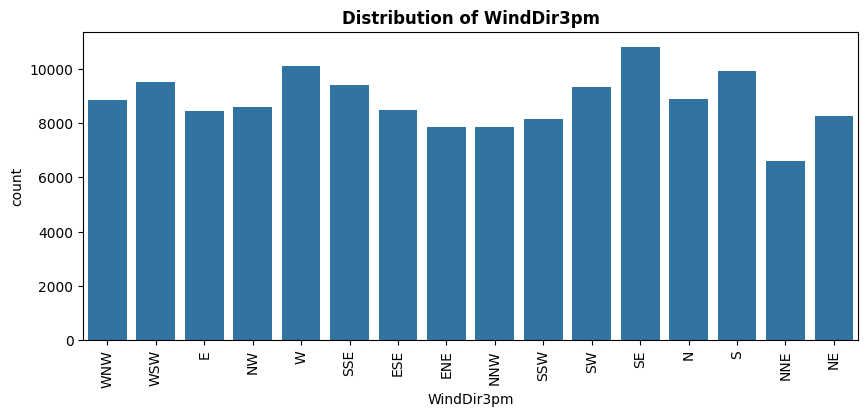

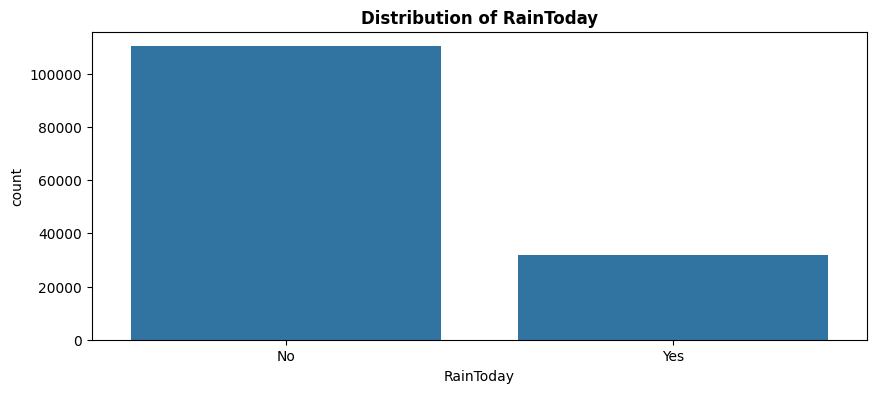

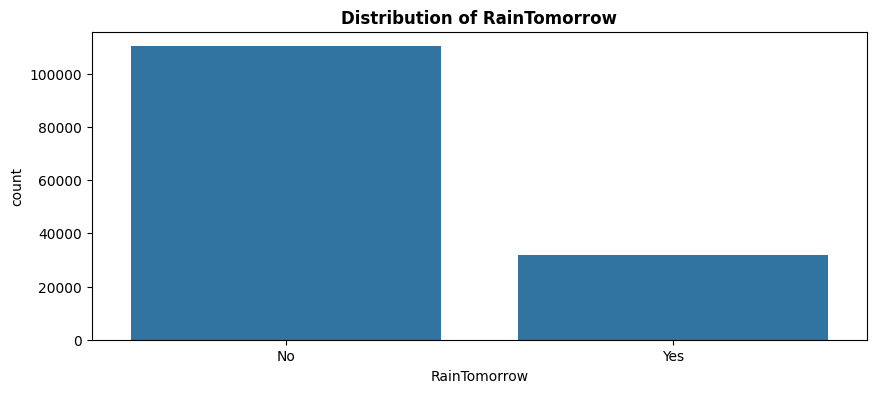

In [12]:
for i in categorical_feature:
    plt.figure(figsize=(10, 4))
    sns.countplot(x=df[i])
    plt.title(f"Distribution of {i}", fontweight="bold")
    plt.xlabel(i)
    if df[i].nunique() > 3:
        plt.xticks(rotation=90)
    plt.show()

**Insights**
- `Location`, `WindGusDir`, `WindDir9am`, and `WindDir3pm` are evenly distributed data.
- `RainToday`, `RainTomorrow` are imbalanced data.

#### Bivariate Analysis

Numerical Vs Numerical

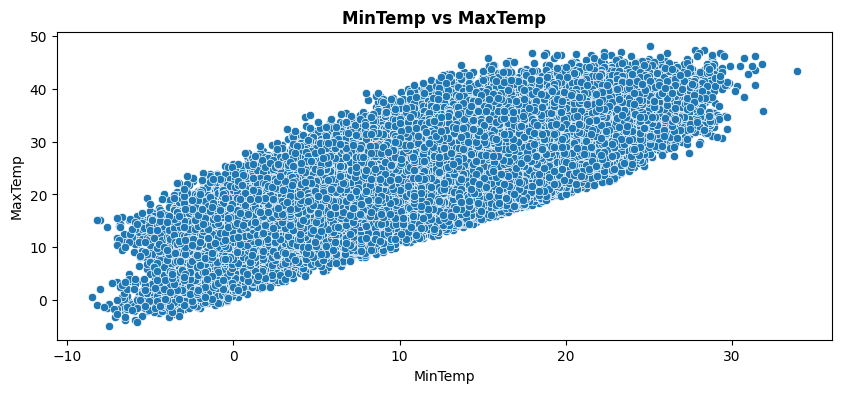

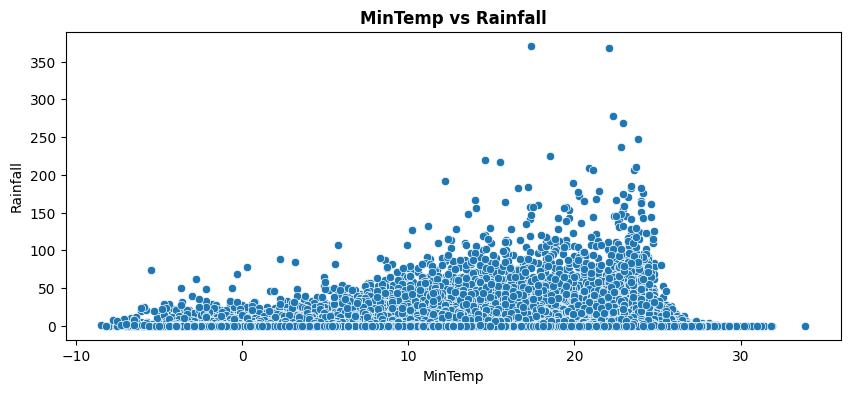

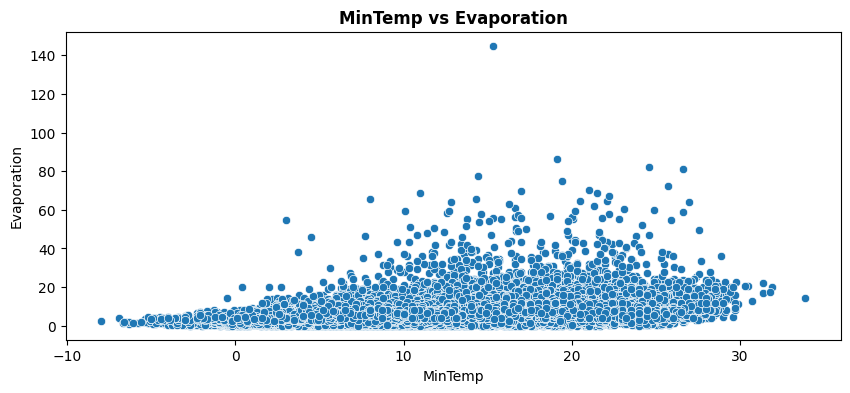

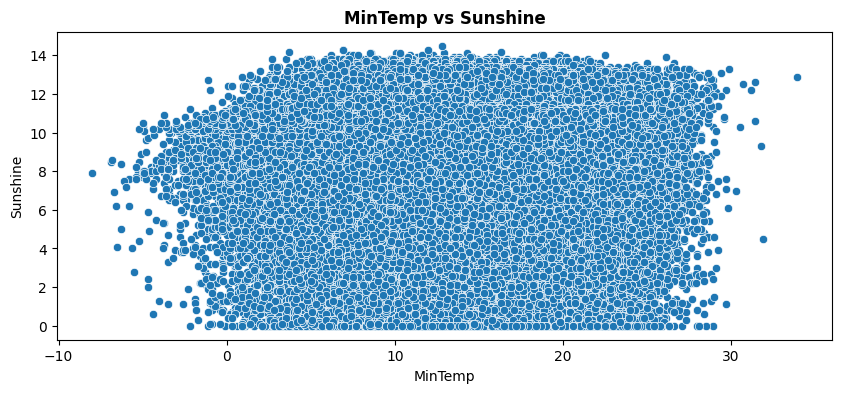

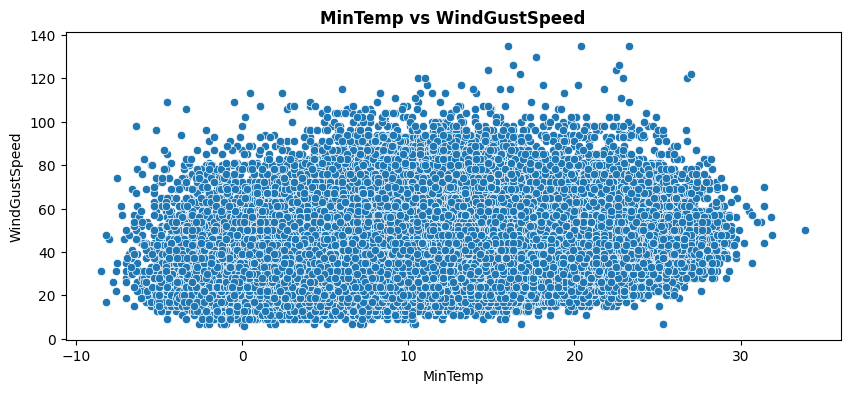

...

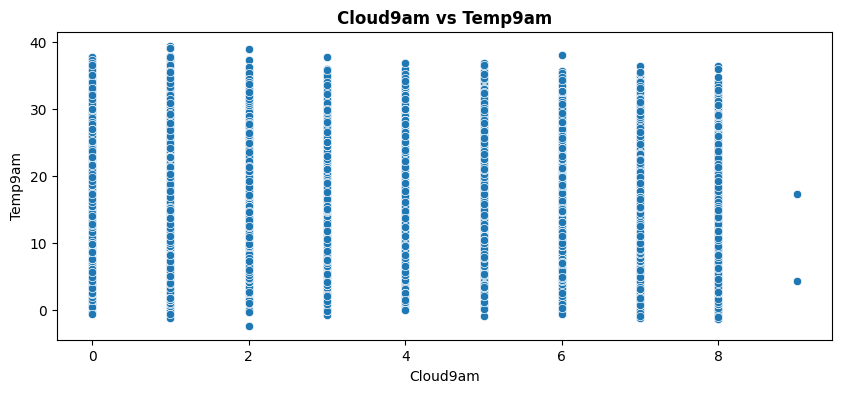

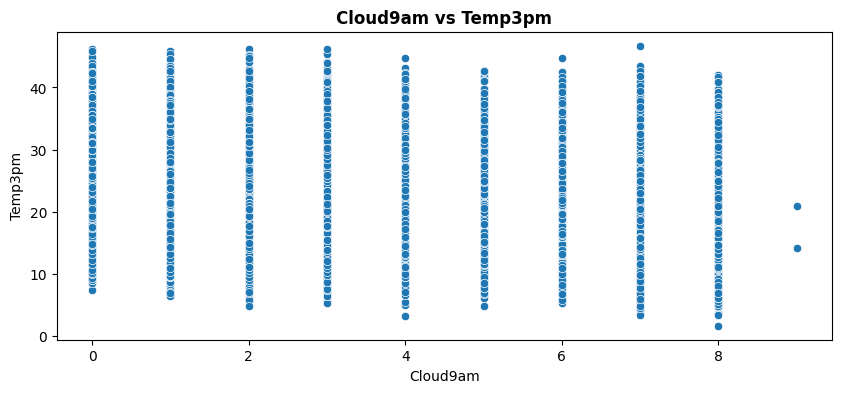

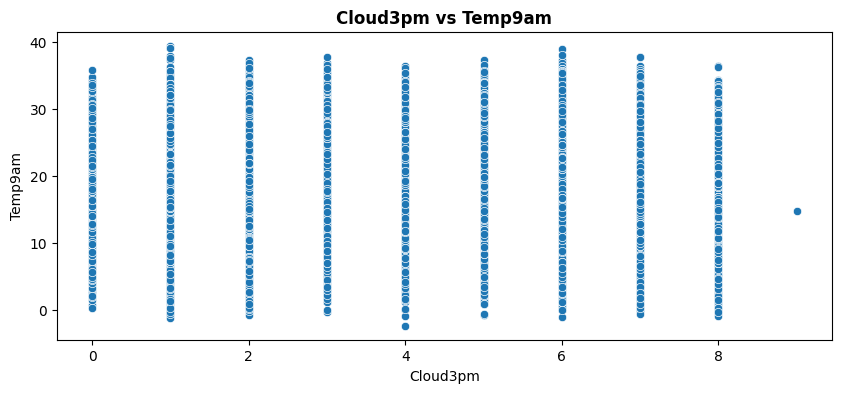

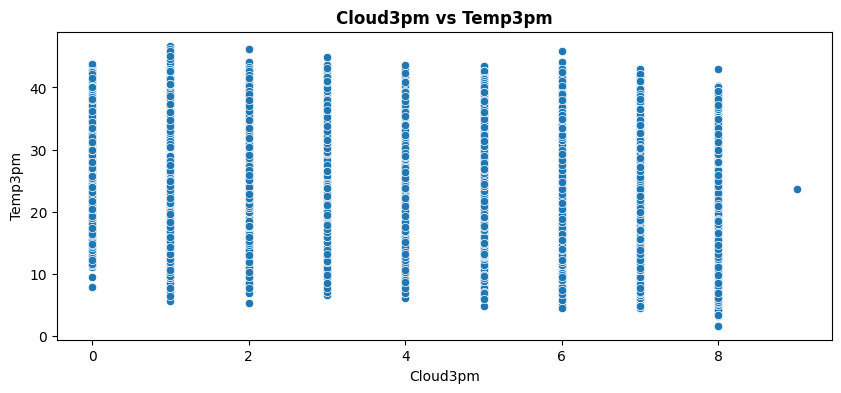

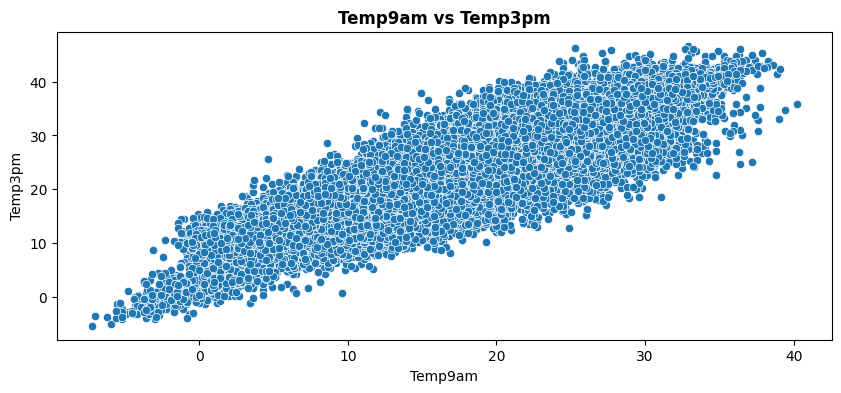

In [ ]:
# Changes to pairplot ASAP
for idx, i in enumerate(numerical_feature):
    for j in numerical_feature[idx+1:]:
        plt.figure(figsize=(10, 4))
        sns.scatterplot(df, x=df[i], y=df[j])
        plt.title(f"{i} vs {j}", fontweight='bold')
        plt.xlabel(i)
        plt.ylabel(j)
        plt.show()

Categorical Vs Numerical Features

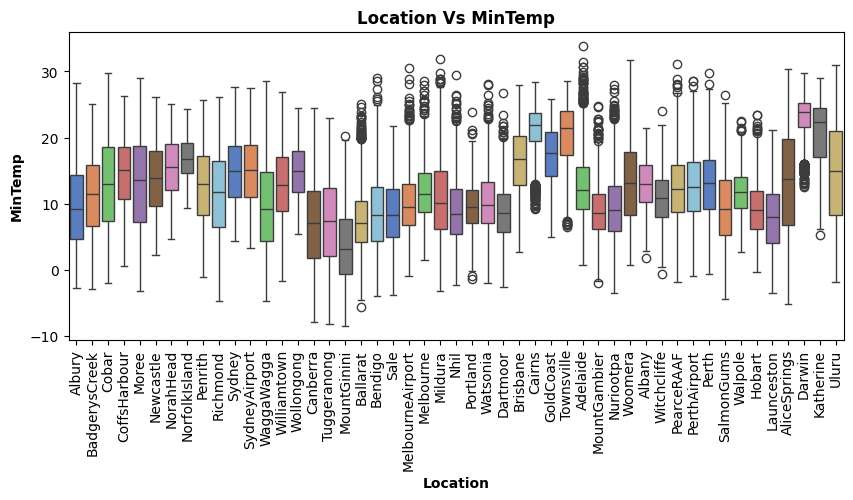

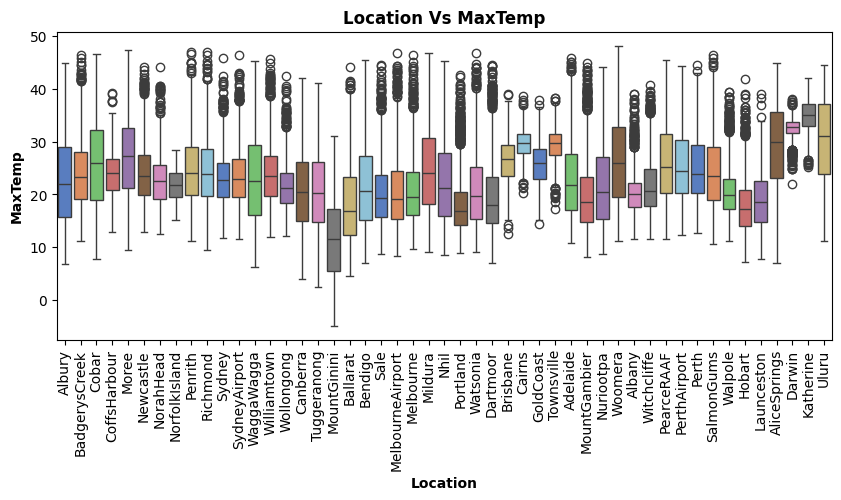

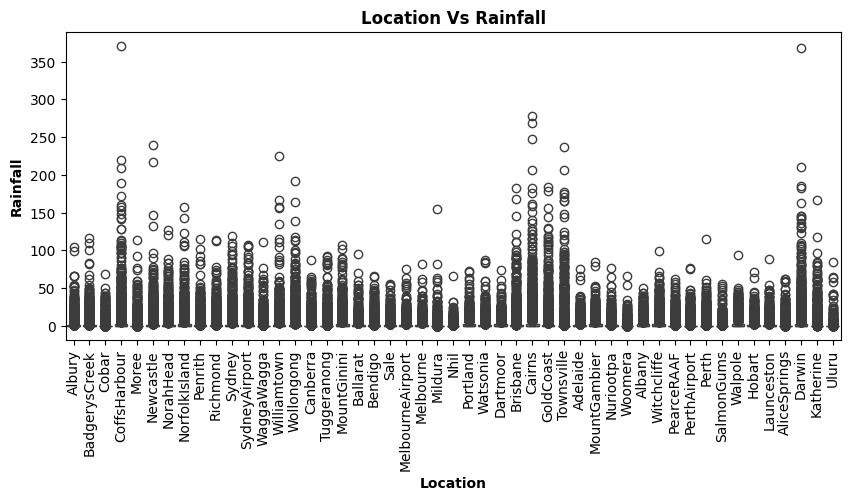

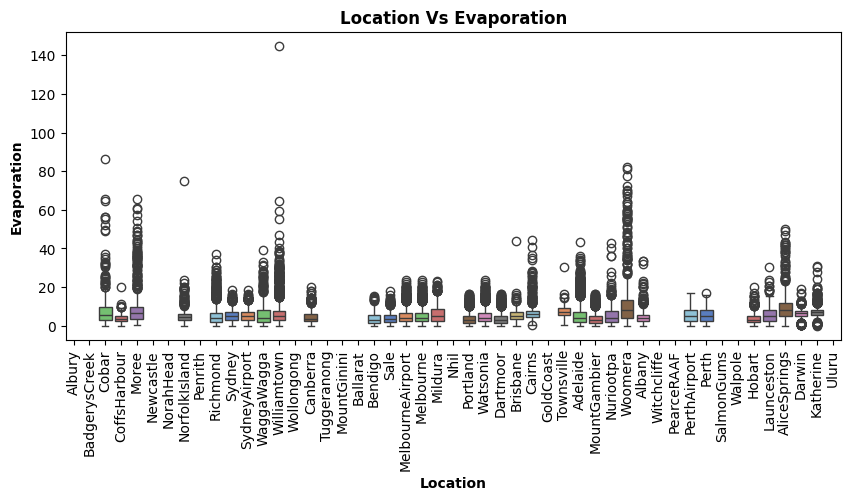

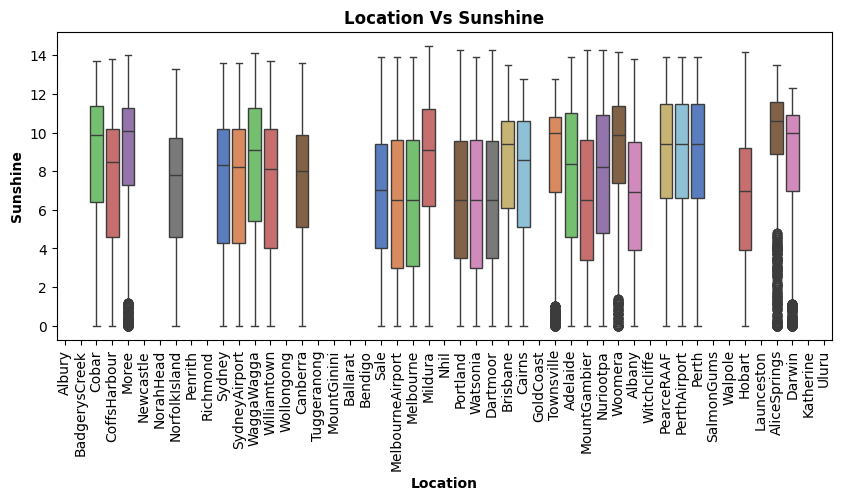

...

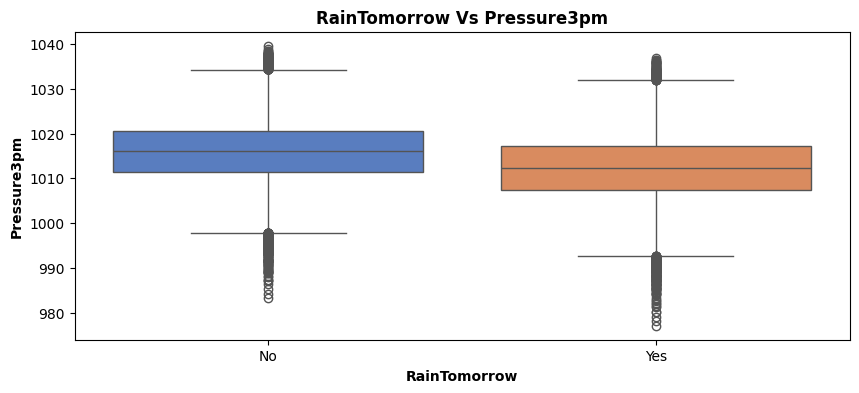

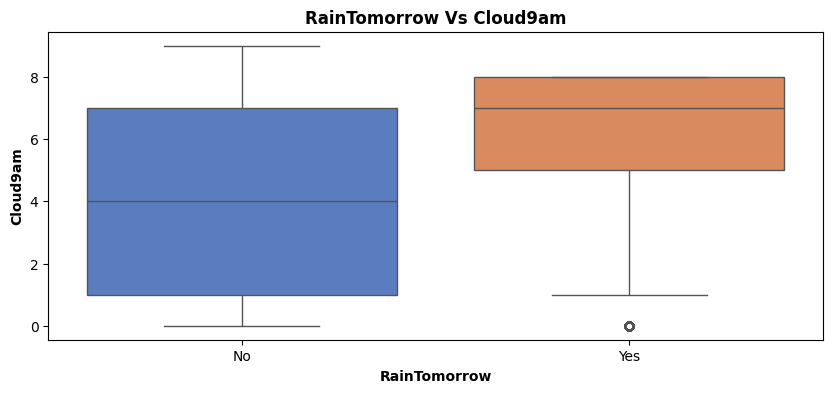

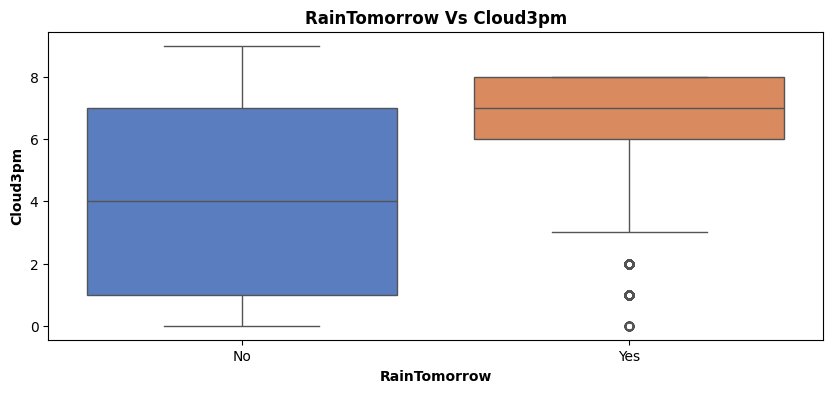

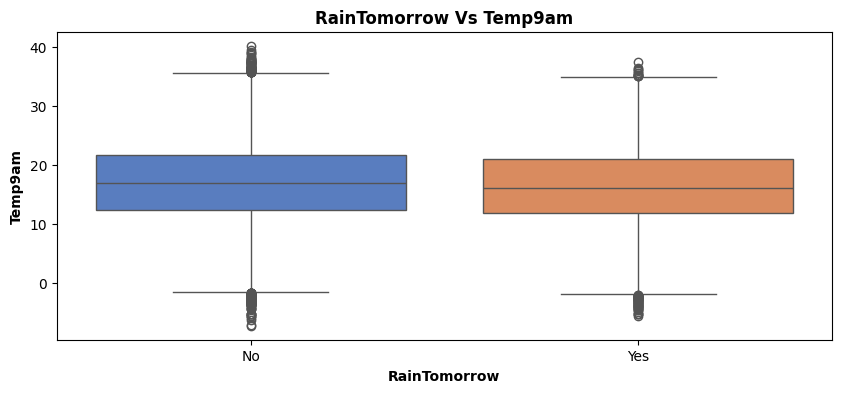

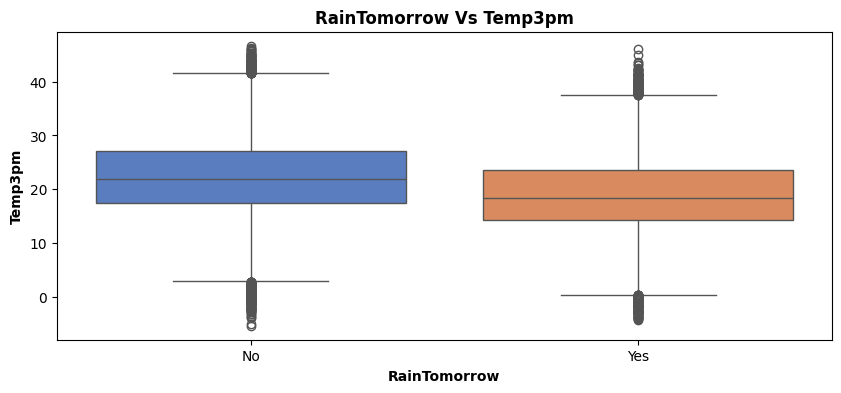

In [14]:
for i in categorical_feature:
    for j in numerical_feature:
        plt.figure(figsize=(10, 4))
        sns.boxplot(df, x=df[i], y=df[j], palette="muted", hue=df[i], legend=False)
        plt.title(f"{i} Vs {j}", fontweight="bold")
        plt.xlabel(i, fontweight='bold')
        plt.ylabel(j, fontweight='bold')
        if df[i].nunique() > 5:
            plt.xticks(rotation=90)
        plt.show()

**Insights**
- Outliers found on some features. Need to handle it with common strategy likes dropping or capping with IQR or Zscores method.

#### Multivariate Analysis

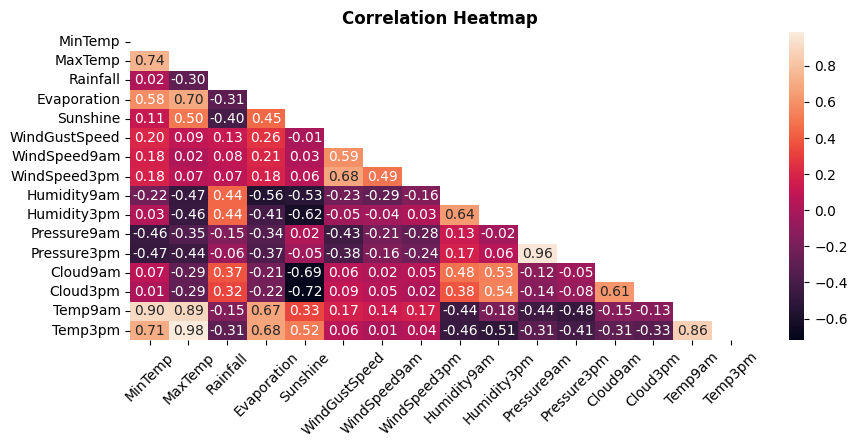

In [20]:
plt.figure(figsize=(10, 4))
mask = np.triu(np.ones_like(df[numerical_feature].corr(method="spearman"), dtype=bool))
sns.heatmap(df[numerical_feature].corr(method="spearman"), annot=True, fmt=".2f", mask=mask)
plt.title('Correlation Heatmap', fontweight='bold')
plt.xticks(rotation=45)
plt.show()